# <center>Comprehensive Analysis on Corona Virus![COVID-19](https://emojipedia-us.s3.dualstack.us-west-1.amazonaws.com/thumbs/120/joypixels/257/face-with-medical-mask_1f637.png)<center>

# <center>Introduction to COVID-19</center>
<hr>

![COVID-19](https://images.unsplash.com/photo-1592438180918-aeae57a279d4?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=750&q=80)


> **Coronavirus** is a family of viruses that can cause illness, which can vary from *common cold* and *cough* to sometimes more severe disease. **Middle East Respiratory Syndrome (MERS-CoV)** and **Severe Acute Respiratory Syndrome (SARS-CoV)** were such severe cases with the world already has faced.<br> **SARS-CoV-2 (n-coronavirus)** is the new virus of the coronavirus family, which first *discovered* in 2019, which has not been identified in humans before. It is a *contiguous* virus which started from **Wuhan** in **December 2019**. Which later declared as **Pandemic** by **WHO** due to high rate spreads throughout the world. Currently (on the date 10 June 2020), this leads to a total of *500K+ Deaths* across the globe.<br>
Pandemic is spreading all over the world; it becomes more important to understand about this spread. This NoteBook is an effort to analyze the cumulative data of confirmed, deaths, and recovered cases over time. In this notebook, the main focus is to analyze the spread trend of this virus all over the world. 


<hr>
Please don't PANIC, stay safe, We all can defeat this together. Please don't spread rumors.# 
<a href="#colum">Go to </a>

In [27]:
import pandas as pd
import numpy as np
import folium
import requests
import matplotlib.pyplot as plt
import plotly.express as px 
import plotly.graph_objects as go
import pycountry_convert as pc
from IPython.display import HTML
from pandas_profiling import ProfileReport

#var
repo = "output.html"

# Reading CSV and  Preprocessing 
<br>
total csv - 7
<br>
total json - 1

<hr> 
* Pandas - for dataset handeling
* Numpy - Support for Pandas and calculations 
* Matplotlib - for visualization (Platting graphas)
* plotly - for interative plots

In [28]:
df_confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
df_covid19 = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")
df_table = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",parse_dates=['Last_Update'])


df_covid_data = pd.read_csv('statewise.csv') #load csv (csv_file_name : statewise.csv)


# axis = 1 if u want to perform statistical calculation rowise  
df_covid19 = df_covid19.drop(["People_Tested","People_Hospitalized","UID","ISO3","Mortality_Rate"],axis =1)
df_covid19

,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate
0,Afghanistan,2020-12-28 12:22:32,33.939110,67.709953,51172.0,2172.0,41366.0,7634.0,131.451787
1,Albania,2020-12-28 12:22:32,41.153300,20.168300,56254.0,1153.0,31565.0,23536.0,1954.757106
2,Algeria,2020-12-28 12:22:32,28.033900,1.659600,98249.0,2728.0,65862.0,29659.0,224.051683
3,Andorra,2020-12-28 12:22:32,42.506300,1.521800,7821.0,83.0,7288.0,450.0,10122.306348
4,Angola,2020-12-28 12:22:32,-11.202700,17.873900,17240.0,399.0,10354.0,6487.0,52.454997
...,...,...,...,...,...,...,...,...,...
186,Vietnam,2020-12-28 12:22:32,14.058324,108.277199,1451.0,35.0,1303.0,113.0,1.490673
187,West Bank and Gaza,2020-12-28 12:22:32,31.952200,35.233200,134310.0,1332.0,110927.0,22051.0,2632.798423
188,Yemen,2020-12-28 12:22:32,15.552727,48.516388,2094.0,607.0,1384.0,103.0,7.020728
189,Zambia,2020-12-28 12:22:32,-13.133897,27.849332,19943.0,384.0,18296.0,1263.0,108.480460


# Rename cols

In [29]:
df_confirmed = df_confirmed.rename(columns={"Province/State":"state","Country/Region": "country"})
df_deaths    = df_deaths.rename(columns={"Province/State":"state","Country/Region": "country"})
df_covid19   = df_covid19.rename(columns={"Country_Region": "country"})

df_covid19["Active"] = df_covid19["Confirmed"]-df_covid19["Recovered"]-df_covid19["Deaths"]

# Defining Functions
 <hr>

In [30]:
def plot_contriwise_bar(country_wise_cases,type_):
    color = {
        "Confirmed" : "darkcyan",
        "Deaths"    : "crimson",
        "Active"    : "darkorange",
        "Recovered" : "darkgreen"
    }
    plt.figure(figsize=(20,10))
    plt.axes(axisbelow=True)
    plt.barh(country_wise_cases.sort_values(type_)[type_].index[-15:],country_wise_cases.sort_values(type_)[type_].values[-15:],color=color[type_])
    plt.xlabel(f"{type_} Cases",fontsize=20)
    plt.title(f"Top 15 Countries ({type_} Cases)",fontsize=20)
    return plt


def process_contry_name(df):
    columns = ['country','Country_Region']
    data_frams_covid = df
    rename_index = {
        "US"               : "USA",
        "Korea, South"     : "South Korea",
        "Taiwan*"          : "Taiwan",
        "Congo (Kinshasa)" : "Democratic Republic of the Congo",
        "Cote d'Ivoire"    : "Côte d'Ivoire",
        "Reunion"          : "Réunion",
        "Bahamas, The"     : "Bahamas",
        "Gambia, The"      : "Gambia",
    }

    df_list = []
    for frame in data_frams_covid:
        for cols in columns:
            for key in rename_index:
                try:
                    frame.loc[frame[cols] == key, cols] = rename_index[key]
                except:
                    pass
        df_list.append(frame)
    return df_list

def asii_decode(asciistring):
    return asciistring.encode('ascii', 'ignore').decode('ascii')
    
def country_to_continent_code(country):
    continents = {
        'NA': 'North America',
        'SA': 'South America', 
        'AS': 'Asia',
        'OC': 'Australia',
        'AF': 'Africa',
        'EU' : 'Europe',
        'na' : 'Others'
    }
    try:
        return continents[pc.country_alpha2_to_continent_code(pc.country_name_to_country_alpha2(country))]
    except :
        return 'na'

def satewise_cases(type_):
    dataset_timeseries_statewise = {}
    state = []
    date_ = []
    for state_code in data:
        dataset_timeseries_statewise[state_code] = {}
        state.append(state_code)
        for date in data[state_code]:
            date_.append(date)
            dataset_timeseries_statewise[state_code][date] = 0
            for total in data[state_code][date]:
                if total == "total":
                    for case_ in data[state_code][date][total]:
                        if case_ == type_:
                            if data[state_code][date][total][case_] == "":
                                dataset_timeseries_statewise[state_code][date] = 0    
                            else:
                                dataset_timeseries_statewise[state_code][date] = data[state_code][date][total][case_]

    return {"state" : state ,"timeseries" : dataset_timeseries_statewise,"date":date_}

def process_cases(cases,code = "all",data = {}):
    dict_ = data
    if code == "all":
        for key in cases:
            dict_[key] = {}
            try:
                dict_[key]["date"]  = list(cases[key].keys())
                dict_[key]["cases"] = list(cases[key].values())
            except:
                pass
            process_cases(cases[key],dict_)
    return dict_
    # pass
def per_daily(cases,condition=True):
    _daily_increase_positive_corona = []
    for i,_ in enumerate(cases):
        if i == 0:
            _daily_increase_positive_corona.append(cases[i])
        else:
            p_case = abs(cases[i] - cases[i-1])
            if condition:
                if p_case == 0:
                    p_case = cases[i]
            _daily_increase_positive_corona.append(p_case)
    return _daily_increase_positive_corona

def all_data_statewise(case):
    all_data = {}
    for ix in case:
        if ix != "TT":
            all_data[ix] =  sum(per_daily(case[ix]["cases"],False))
    return all_data


def go_plot(y,x = None,title=""):
    fig = go.Figure()
    for yaxes in y:
        fig.add_trace(go.Scatter(x=x, y=y[yaxes],mode='lines+markers',name=yaxes))
        fig.update_layout(title=title,
                   xaxis_title='State',
                   yaxis_title='Cases')
    return fig

def returndfvalue(value):
    return value

def daily_increase_statewise(cc,cr,ct,cd):
    increase_statewise = {}
    for state_code,_,_,_ in zip(cc,cr,ct,cd):
        if state_code != "TT":
            increase_statewise[state_code] = {}
            increase_statewise[state_code]["date"]      = list(cc[state_code].keys())
            increase_statewise[state_code]["confirmed"] = per_daily(list(cc[state_code].values()),False)
            increase_statewise[state_code]["recovered"] = per_daily(list(cr[state_code].values()),False)
            increase_statewise[state_code]["tested"]    = per_daily(list(ct[state_code].values()),False)
            increase_statewise[state_code]["deceased"]  = per_daily(list(cd[state_code].values()),False)

    return increase_statewise

def plot_daily_increase(daily_state_wise_increase,limit = "all"):
    idx = 0
    for i in daily_state_wise_increase:
        if idx == limit and limit != "all":
            break
        y = {
            "Confirmed" : daily_state_wise_increase[i]['confirmed'],
            "Recovered" : daily_state_wise_increase[i]['recovered'],
            "Deaths"    : daily_state_wise_increase[i]['deceased']
        }
        idx = idx + 1
        go_plot(y,daily_state_wise_increase[i]['date']).show()
   
    pass

# Getting all Countries

In [31]:
data_frame = process_contry_name([df_confirmed,df_deaths,df_covid19,df_table])

df_confirmed = data_frame[0]
df_deaths    = data_frame[1]
df_covid19   = data_frame[2]
df_table     = data_frame[3]

# getting all countries
countries  = np.asarray(df_confirmed["country"])
countries1 = np.asarray(df_covid19["country"])

# Collecting Continent Information

In [32]:
#Collecting Continent Information
df_confirmed.insert(2,"continent", [country_to_continent_code(country) for country in countries[:]])
df_deaths.insert(2,"continent",  [country_to_continent_code(country) for country in countries[:]])
df_covid19.insert(1,"continent",  [country_to_continent_code(country) for country in countries1[:]])
df_table.insert(1,"continent",  [country_to_continent_code(country) for country in df_table["Country_Region"].values])

df_countries_cases       = df_covid19.copy().drop(['Lat','Long_','continent','Last_Update'],axis=1)
df_countries_cases.index = df_countries_cases["country"]
df_countries_cases       = df_countries_cases.drop(['country'],axis=1)

df_continents_cases = df_covid19.copy().drop(['Lat','Long_','country','Last_Update'],axis =1)
df_continents_cases = df_continents_cases.groupby(["continent"]).sum()

df_countries_cases.fillna(0,inplace=True)
df_continents_cases.fillna(0,inplace=True)

# continents wisecases

In [33]:
df_continents_cases

,Confirmed,Deaths,Recovered,Active,Incident_Rate
continent,,,,,
Africa,2657188.0,62706.0,2220814.0,373668.0,14890.826413
Asia,20179582.0,328966.0,18637449.0,1213167.0,59775.770853
Australia,31331.0,945.0,28528.0,1858.0,180.424614
Europe,22807466.0,522806.0,10836163.0,10118021.0,158087.601446
North America,21997452.0,489352.0,2218782.0,485700.0,27791.574275
South America,12877665.0,356504.0,11576320.0,944841.0,23019.626268
na,314516.0,5364.0,260298.0,48854.0,9118.912037


# Countries wisecases

In [34]:
df_countries_cases

,Confirmed,Deaths,Recovered,Active,Incident_Rate
country,,,,,
Afghanistan,51172.0,2172.0,41366.0,7634.0,131.451787
Albania,56254.0,1153.0,31565.0,23536.0,1954.757106
Algeria,98249.0,2728.0,65862.0,29659.0,224.051683
Andorra,7821.0,83.0,7288.0,450.0,10122.306348
Angola,17240.0,399.0,10354.0,6487.0,52.454997
...,...,...,...,...,...
Vietnam,1451.0,35.0,1303.0,113.0,1.490673
West Bank and Gaza,134310.0,1332.0,110927.0,22051.0,2632.798423
Yemen,2094.0,607.0,1384.0,103.0,7.020728


# Total (<i>Confirmed, Deaths, Recovered, Mortality Rate, Incident_Rate</i>)

In [35]:
df_t = pd.DataFrame(pd.to_numeric(df_countries_cases.sum()),dtype=np.float64).transpose()

df_t["Mortality Rate (per 100)"] = np.round(100*df_t["Deaths"]/df_t["Confirmed"],2)

df_t.style.background_gradient(cmap='Wistia',axis=1).format("{:.2f}").format("{:.0f}",subset=["Confirmed","Deaths","Recovered","Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
0,80865200,1766643,45778354,13186109,292864.74,2.18


# Coninent Wise Reported Cases

In [36]:
# Coninent Wise Reported Cases

df_continents_cases["Mortality Rate (per 100)"] = np.round(100*df_continents_cases["Deaths"]/
df_continents_cases["Confirmed"],2)
df_continents_cases.style.background_gradient(cmap='Blues',subset=["Confirmed"])\
.background_gradient(cmap='Reds',subset=["Deaths"])\
.background_gradient(cmap='Greens',subset=["Recovered"])\
.background_gradient(cmap='Purples',subset=["Active"])\
.background_gradient(cmap='Pastel1_r',subset=["Incident_Rate"])\
.background_gradient(cmap='YlOrBr',subset=["Mortality Rate (per 100)"])\
.format("{:.2f}")\
.format("{:.0f}",subset=["Confirmed","Deaths","Recovered","Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
continent,,,,,,
Africa,2657188,62706,2220814,373668,14890.83,2.36
Asia,20179582,328966,18637449,1213167,59775.77,1.63
Australia,31331,945,28528,1858,180.42,3.02
Europe,22807466,522806,10836163,10118021,158087.60,2.29
North America,21997452,489352,2218782,485700,27791.57,2.22
South America,12877665,356504,11576320,944841,23019.63,2.77
na,314516,5364,260298,48854,9118.91,1.71


# Country Wise Reported Cases

In [37]:
df_countries_cases["Mortality Rate (per 100)"] = np.round(100*df_countries_cases["Deaths"]/df_countries_cases["Confirmed"],2)
df_countries_cases.sort_values('Confirmed', ascending= False).style.background_gradient(cmap='Blues',subset=["Confirmed"])\
.background_gradient(cmap='Reds',subset=["Deaths"])\
.background_gradient(cmap='Greens',subset=["Recovered"])\
.background_gradient(cmap='Purples',subset=["Active"])\
.background_gradient(cmap='Pastel1_r',subset=["Incident_Rate"])\
.background_gradient(cmap='YlOrBr',subset=["Mortality Rate (per 100)"])\
.format("{:.2f}")\
.format("{:.0f}",subset=["Confirmed","Deaths","Recovered","Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
country,,,,,,
USA,19136758,333140,0,0,5808.41,1.74
India,10207871,147901,9782669,277301,739.70,1.45
Brazil,7484285,191139,6677235,615911,3521.03,2.55
Russia,3047335,54559,2446412,546364,2088.15,1.79
France,2616510,62867,195861,2357782,4008.53,2.40
United Kingdom,2295273,70860,5100,2219313,3381.07,3.09
Turkey,2147578,19878,2015230,112470,2546.36,0.93
Italy,2047696,71925,1394011,581760,3386.76,3.51
Spain,1854951,49824,150376,1654751,3967.40,2.69


## Bar Horizontal For (Confirmed, Deaths, Active, Recovered) Country Wise Cases

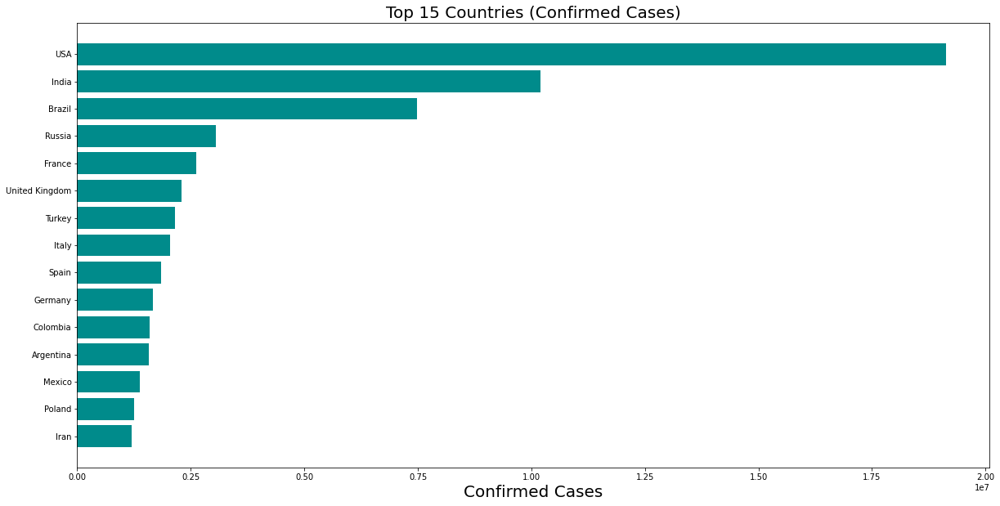

In [38]:
# Confirmed graph
plot_contriwise_bar(df_countries_cases,"Confirmed").show()

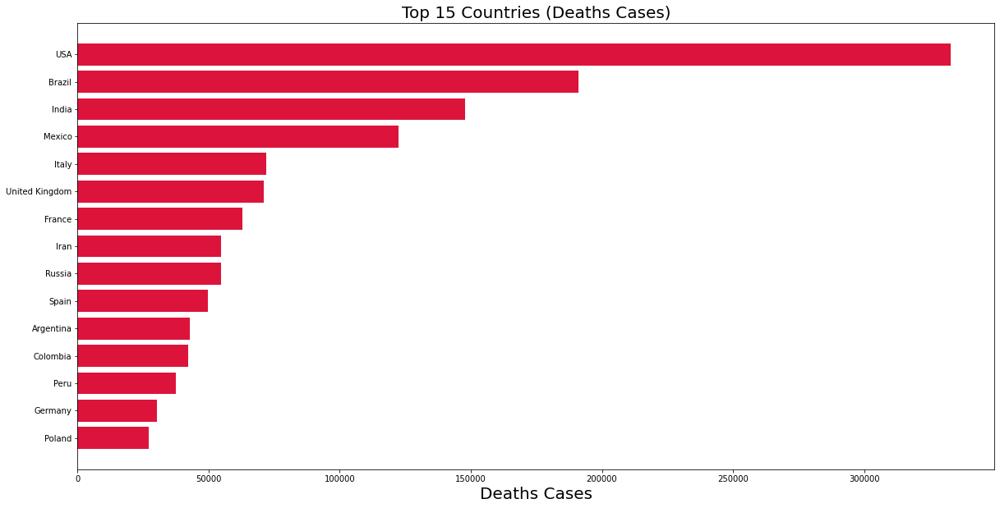

In [39]:
# Deaths graph
plot_contriwise_bar(df_countries_cases,"Deaths").show()

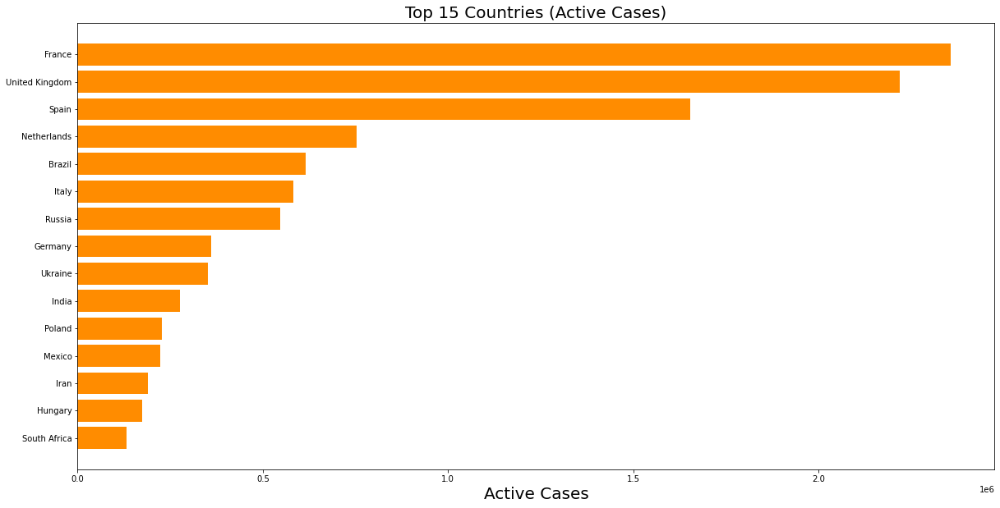

In [40]:
# Active graph
plot_contriwise_bar(df_countries_cases,"Active").show()

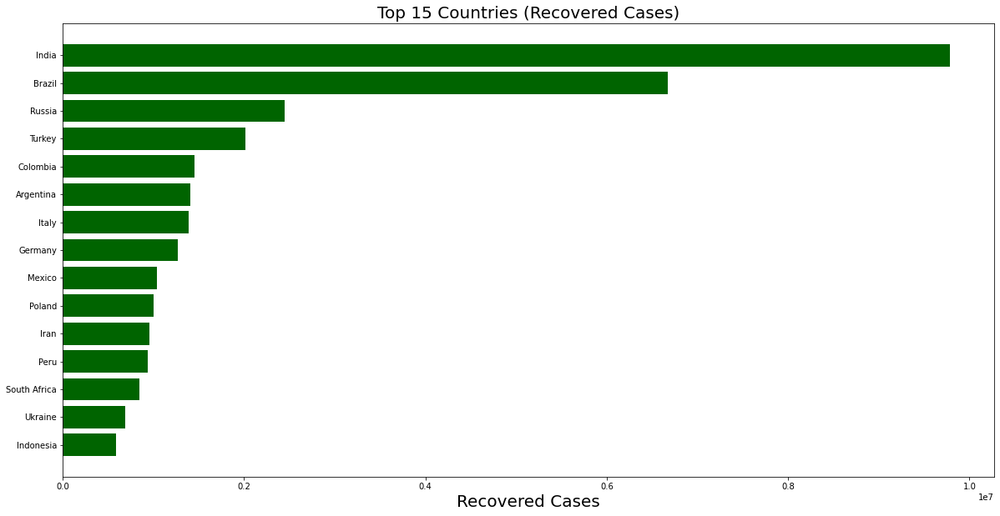

In [41]:
# Recovered graph
plot_contriwise_bar(df_countries_cases,"Recovered").show()

# World Map

In [105]:
#  World Map Visulisation 

world_map = folium.Map(location=[10,0], tiles="cartodbpositron", zoom_start=2,max_zoom=6,min_zoom=2)
for i in range(0,len(df_confirmed)):
    folium.Circle(
        location=[df_confirmed.iloc[i]['Lat'], df_confirmed.iloc[i]['Long']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df_confirmed.iloc[i]['country']+"</h5>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df_confirmed.iloc[i,-1])+"</li>"+
        "<li>Deaths:   "+str(df_deaths.iloc[i,-1])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df_deaths.iloc[i,-1]/(df_confirmed.iloc[i,-1]+1.00001)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=(int((np.log(df_confirmed.iloc[i,-1]+1.00001)))+0.2)*50000,
        color='#ffcccb',
        fill_color='red',
        fill=True).add_to(world_map)
world_map

ValueError: Location values cannot contain NaNs.

#  Range World Cases

In [63]:
#  Range World Cases

df_data = df_table.groupby(['Last_Update', 'Country_Region'])['Confirmed', 'Deaths'].max().reset_index().fillna(0)
df_data["Last_Update"] = pd.to_datetime( df_data["Last_Update"]).dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(df_data, locations="Country_Region", locationmode='country names', 
    color=np.power(df_data["Deaths"],0.3)-2 , size= np.power(df_data["Confirmed"]+1,0.3)-1, hover_name="Country_Region",
    hover_data=["Deaths"],
    range_color= [0, max(np.power(df_data["Confirmed"],0.3))], 
    projection="natural earth", animation_frame="Last_Update", 
    color_continuous_scale=px.colors.sequential.Plasma,
    title='COVID-19: Progression of spread'
)

fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.show()
#Notes: hear the data is start upto01/22/2020

# Api request "<a href='https://api.covid19india.org'>covid19india</a>"

In [64]:
URL      = "https://api.covid19india.org/v3/timeseries.json"
response = requests.get(url = URL)
data     = response.json()
data

946,
    'tested': 43618},
   'total': {'confirmed': 247425,
    'deceased': 4781,
    'recovered': 216921,
    'tested': 3098657}},
  '2020-09-28': {'delta': {'confirmed': 3155,
    'deceased': 56,
    'recovered': 2923,
    'tested': 41281},
   'total': {'confirmed': 250580,
    'deceased': 4837,
    'recovered': 219844,
    'tested': 3139938}},
  '2020-09-29': {'delta': {'confirmed': 3188,
    'deceased': 62,
    'recovered': 2961,
    'tested': 43759},
   'total': {'confirmed': 253768,
    'deceased': 4899,
    'recovered': 222805,
    'tested': 3183697}},
  '2020-09-30': {'delta': {'confirmed': 3281,
    'deceased': 59,
    'recovered': 2954,
    'tested': 43765},
   'total': {'confirmed': 257049,
    'deceased': 4958,
    'recovered': 225759,
    'tested': 3227462}},
  '2020-10-01': {'delta': {'confirmed': 3275,
    'deceased': 59,
    'recovered': 2996,
    'tested': 43854},
   'total': {'confirmed': 260324,
    'deceased': 5017,
    'recovered': 228755,
    'tested': 3271316}},

In [65]:
statewise_confirmed_meta = satewise_cases("confirmed")['timeseries']
statewise_recovered_meta = satewise_cases("recovered")['timeseries']
statewise_tested_meta    = satewise_cases("tested")['timeseries']
statewise_deceased_meta  = satewise_cases("deceased")['timeseries']
all_state  = list(map(returndfvalue,data))

statewise_confirmed = process_cases(statewise_confirmed_meta,"all",{})
statewise_recoverd  = process_cases(statewise_recovered_meta,"all",{})
statewise_tested    = process_cases(statewise_tested_meta,"all",{})
statewise_deceased  = process_cases(statewise_deceased_meta,"all",{})

# statewise Confirmed, Recovered, Deaths

In [66]:
j = 0
for st_cd in all_state:
    if j == 5:
        break
    
    df_st_cd = pd.DataFrame(statewise_confirmed[st_cd]["date"],columns=['Date'])
    df_st_cd.insert(1,"ConfirmedCases",statewise_confirmed[st_cd]["cases"])
    df_st_cd.insert(2,"RecoveredCases",statewise_recoverd[st_cd]["cases"])
    df_st_cd.insert(3,"DeathCases",statewise_deceased[st_cd]["cases"])
    # df_st_cd['MortalityRate'] = np.round(100*st_cd["DeathCases"]/st_cd["ConfirmedCases"],2)

    y = {
        "Confirmed" : list(map(returndfvalue,df_st_cd['ConfirmedCases'])),
        "Recovered" : list(map(returndfvalue,df_st_cd['RecoveredCases'])),
        "Deaths"    : list(map(returndfvalue,df_st_cd['DeathCases'])),
        # "Mortality Rate"    : list(map(returndfvalue,df_st_cd['MortalityRate']))
    }
    j = j+1
    
    go_plot(y,df_st_cd["Date"],st_cd).show()

# Individual State Graph
## <b>(Gujarat)</b>

In [67]:
df_statewise_gujarat = pd.DataFrame(statewise_confirmed["GJ"]["date"],columns=['Date'])
df_statewise_gujarat.insert(1,"ConfirmedCases",statewise_confirmed["GJ"]["cases"])
df_statewise_gujarat.insert(2,"RecoveredCases",statewise_recoverd["GJ"]["cases"])
df_statewise_gujarat.insert(3,"DeathCases",statewise_deceased["GJ"]["cases"])
df_statewise_gujarat['MortalityRate'] = np.round(100*df_statewise_gujarat["DeathCases"]/df_statewise_gujarat["ConfirmedCases"],2)

In [68]:
# ConfirmedCases graph
px.line(df_statewise_gujarat,x="Date",y="ConfirmedCases").show()

In [69]:
# RecoveredCases graph
px.line(df_statewise_gujarat,x="Date",y="RecoveredCases").show()

In [70]:
# DeathCases graph
px.line(df_statewise_gujarat,x="Date",y="DeathCases").show()

In [71]:
# MortalityRate graph
px.line(df_statewise_gujarat,x="Date",y="MortalityRate").show()

# State wise All Confirmed / Death / Recovered / Mortality Rate

In [72]:
all_confirmed_case  = all_data_statewise(statewise_confirmed)
all_recoverd_case   = all_data_statewise(statewise_recoverd)
all_tested_case     = all_data_statewise(statewise_tested)
all_deceased_case   = all_data_statewise(statewise_deceased)

df_all_state_crtd = pd.DataFrame(list(all_confirmed_case.keys()),columns=['State'])
df_all_state_crtd.insert(1,"confirmed",all_confirmed_case.values())
df_all_state_crtd.insert(2,"recovered",all_recoverd_case.values())
df_all_state_crtd.insert(3,"tested",all_tested_case.values())
df_all_state_crtd.insert(4,"deceased",all_deceased_case.values())
df_all_state_crtd["MortalityRate"] = np.round(100*df_all_state_crtd["deceased"]/df_all_state_crtd["confirmed"],2)

# Total cases 

In [73]:
df_all_state_crtd.sort_values('confirmed', ascending= False).style.background_gradient(cmap='Blues',subset=["confirmed"])\
.background_gradient(cmap='Greens',subset=["recovered"])\
.background_gradient(cmap='Greys',subset=["tested"])\
.background_gradient(cmap='Pastel1_r',subset=["deceased"])\
.background_gradient(cmap='Reds',subset=["MortalityRate"])

,State,confirmed,recovered,tested,deceased,MortalityRate
18,MH,1931378,1809948,12515774,49255,2.550000
15,KA,916256,891095,13704709,12062,1.320000
1,AP,881061,870342,11620503,7094,0.810000
30,TN,814170,793154,13924527,12069,1.480000
16,KL,740517,672196,7695117,2977,0.400000
7,DL,622851,605685,8545064,10453,1.680000
33,UP,581980,558303,23385939,8306,1.430000
35,WB,547443,524109,6965726,9598,1.750000
24,OR,328738,324068,6855829,1917,0.580000
27,RJ,305360,291533,5173485,2670,0.870000


# StateWise Daily Increase

In [74]:
y = {
    "Confirmed" : list(all_confirmed_case.values()),
    "Recovered" : list(all_recoverd_case.values()),
    "Tested"    : list(all_tested_case.values()),
    "Deaths"    : list(all_deceased_case.values())
}

daily_state_wise_increase = daily_increase_statewise(statewise_confirmed_meta,statewise_recovered_meta,statewise_tested_meta,statewise_deceased_meta)

In [75]:
go_plot(y,all_state).show()

# Daily Increase

In [76]:
plot_daily_increase(daily_state_wise_increase,5)

# load dataframe

In [77]:
df_covid_data #load dataframe

,Date,State,TotalSamples,Negative,Positive
0,2020-04-17,Andaman and Nicobar Islands,1403.0,1391.0,12.0
1,2020-04-24,Andaman and Nicobar Islands,2679.0,2652.0,27.0
2,2020-04-27,Andaman and Nicobar Islands,2848.0,2815.0,33.0
3,2020-05-01,Andaman and Nicobar Islands,3754.0,3721.0,33.0
4,2020-05-16,Andaman and Nicobar Islands,6677.0,6644.0,33.0
...,...,...,...,...,...
2086,2020-06-11,West Bengal,306941.0,297173.0,9768.0
2087,2020-06-12,West Bengal,315699.0,305455.0,10244.0
2088,2020-06-13,West Bengal,324707.0,314009.0,10698.0
2089,2020-06-14,West Bengal,333733.0,322646.0,11087.0


# Filling Bad Values (NaN) or (NaT)

In [78]:
df_covid_data['Negative']  = df_covid_data["TotalSamples"] - df_covid_data["Positive"]
df_covid_data['Positive']  = df_covid_data["TotalSamples"] - df_covid_data["Negative"]

# Local Variable

In [79]:
covid_19 = {
    "date" : [],
    "positive":[],
    "negative":[],
    "totalsample":[],
    "daily-positive-increase":[],
    "daily-negative-increase":[],
    "daily-tested":[]

}

# <h1>State wise Analysis of gujrat</h1>
<hr>
Getting State wise data.
<h1>Gujrat</h1>


In [80]:
# notes: hear the we fetch gujrat cases
dum_df_covid_19_gujarat = df_covid_data['State'] == 'Gujarat'
df_covid_19_gujarat = df_covid_data[dum_df_covid_19_gujarat]
df_covid_19_gujarat

,Date,State,TotalSamples,Negative,Positive
578,2020-04-08,Gujarat,4224.0,4038.0,186.0
579,2020-04-10,Gujarat,7718.0,7340.0,378.0
580,2020-04-11,Gujarat,9763.0,9295.0,468.0
581,2020-04-12,Gujarat,11715.0,11199.0,516.0
582,2020-04-13,Gujarat,14251.0,13679.0,572.0
...,...,...,...,...,...
641,2020-06-11,Gujarat,272924.0,250857.0,22067.0
642,2020-06-12,Gujarat,278137.0,255575.0,22562.0
643,2020-06-13,Gujarat,283623.0,260544.0,23079.0
644,2020-06-14,Gujarat,288565.0,264975.0,23590.0


In [81]:
covid_19['date']        = list(map(returndfvalue,df_covid_19_gujarat["Date"]))
covid_19['positive']    = list(map(returndfvalue,df_covid_19_gujarat["Positive"].abs()))
covid_19['negative']    = list(map(returndfvalue,df_covid_19_gujarat["Negative"].abs()))
covid_19['totalsample'] = list(map(returndfvalue,df_covid_19_gujarat["TotalSamples"].abs()))
#------------------------------------------------------------------------------------------------------------------
covid_19['daily-positive-increase'] = per_daily(covid_19['positive'])
covid_19['daily-negative-increase'] = per_daily(covid_19['negative'])

covid_19['daily-tested']            = per_daily(covid_19['totalsample'])

# Create New DataFrame (Gujarat)
### Coninent Wise Reported Cases 
<hr>
Coninent Wise reported <i><b><u>TotalSamples cases, Positive cases, Negative cases,PositiveIncrease cases, NegativeIncrease cases, TotalTesting cases </i></b></u>

In [82]:
df_covid_data_gujarat = pd.DataFrame(covid_19['date'], columns=['Date'])
df_covid_data_gujarat.insert(1, "TotalSamples", covid_19['totalsample'])
df_covid_data_gujarat.insert(2, "Positive", covid_19['positive'])
df_covid_data_gujarat.insert(3, "Negative", covid_19['negative'])
df_covid_data_gujarat.insert(4, "PositiveIncrease", covid_19['daily-positive-increase'])
df_covid_data_gujarat.insert(5, "NegativeIncrease", covid_19['daily-negative-increase'])
df_covid_data_gujarat.insert(6, "TotalTesting", covid_19['daily-tested'])

### Hear the find Avg. of Positive (Gujarat)

In [83]:
df_covid_data_gujarat['p_Percenage_'] = round((df_covid_data_gujarat['Positive'] / df_covid_data_gujarat['TotalSamples']) * 100,2)
df_covid_data_gujarat['n_Percenage'] = round((df_covid_data_gujarat['Negative'] / df_covid_data_gujarat['TotalSamples']) * 100, 2)

df_covid_data_gujarat

,Date,TotalSamples,Positive,Negative,PositiveIncrease,NegativeIncrease,TotalTesting,p_Percenage_,n_Percenage
0,2020-04-08,4224.0,186.0,4038.0,186.0,4038.0,4224.0,4.40,95.60
1,2020-04-10,7718.0,378.0,7340.0,192.0,3302.0,3494.0,4.90,95.10
2,2020-04-11,9763.0,468.0,9295.0,90.0,1955.0,2045.0,4.79,95.21
3,2020-04-12,11715.0,516.0,11199.0,48.0,1904.0,1952.0,4.40,95.60
4,2020-04-13,14251.0,572.0,13679.0,56.0,2480.0,2536.0,4.01,95.99
...,...,...,...,...,...,...,...,...,...
63,2020-06-11,272924.0,22067.0,250857.0,513.0,6007.0,6520.0,8.09,91.91
64,2020-06-12,278137.0,22562.0,255575.0,495.0,4718.0,5213.0,8.11,91.89
65,2020-06-13,283623.0,23079.0,260544.0,517.0,4969.0,5486.0,8.14,91.86
66,2020-06-14,288565.0,23590.0,264975.0,511.0,4431.0,4942.0,8.17,91.83


# Avg. Gujarat

In [84]:
# negative Percenage
px.line(df_covid_data_gujarat,x = df_covid_data_gujarat['Date'] ,y=df_covid_data_gujarat['n_Percenage']).show()

In [85]:
# positive Percenage
px.line(df_covid_data_gujarat,x = df_covid_data_gujarat['Date'] ,y=df_covid_data_gujarat['p_Percenage_']).show()

In [86]:
# PositiveIncrease graph
px.line(df_covid_data_gujarat,x = df_covid_data_gujarat['Date'] ,y=df_covid_data_gujarat['PositiveIncrease']).show()

In [87]:
# NegativeIncrease graph
px.line(df_covid_data_gujarat,x = df_covid_data_gujarat['Date'] ,y=df_covid_data_gujarat['NegativeIncrease']).show()

In [88]:
# TotalTesting graph
px.line(df_covid_data_gujarat,x = df_covid_data_gujarat['Date'] ,y=df_covid_data_gujarat['TotalTesting']).show()

### Total Positive - Negative Gujarat

In [89]:
total_positive_inprecentage_gujarat = round((df_covid_data_gujarat["PositiveIncrease"].sum() / df_covid_data_gujarat["TotalTesting"].sum()) * 100,2)
total_negative_inprecentage_gujarat = round((df_covid_data_gujarat["NegativeIncrease"].sum() / df_covid_data_gujarat["TotalTesting"].sum()) * 100,2)

print(f"Hear the Total Positive Inprecentage Gujarat -> {total_positive_inprecentage_gujarat}\nHear the Total Negative Inprecentage Gujarat -> {total_negative_inprecentage_gujarat}")

Hear the Total Positive Inprecentage Gujarat -> 8.23
Hear the Total Negative Inprecentage Gujarat -> 91.77


# <h1>State wise Analysis of Maharashtra</h1>
<hr>
Getting State wise data.
<h1>Maharashtra</h1>

In [90]:
# notes: hear the we fetch Maharashtra cases
pd.options.mode.chained_assignment = None
dum_df_covid_19_maharashtra = df_covid_data.State == "Maharashtra"
df_covid_19_maharashtra = df_covid_data.loc[dum_df_covid_19_maharashtra]
df_covid_19_maharashtra.dropna()

,Date,State,TotalSamples,Negative,Positive
1168,2020-04-06,Maharashtra,17563.0,16695.0,868.0
1169,2020-04-07,Maharashtra,20877.0,19859.0,1018.0
1170,2020-04-09,Maharashtra,20877.0,20009.0,868.0
1171,2020-04-10,Maharashtra,30000.0,28865.0,1135.0
1172,2020-04-11,Maharashtra,31841.0,30080.0,1761.0
...,...,...,...,...,...
1233,2020-06-11,Maharashtra,610790.0,516749.0,94041.0
1234,2020-06-12,Maharashtra,626521.0,528873.0,97648.0
1235,2020-06-13,Maharashtra,643057.0,541916.0,101141.0
1236,2020-06-14,Maharashtra,659481.0,554913.0,104568.0


# Create New DataFrame (Maharashtra)
### Coninent Wise Reported Cases 
<hr>
Coninent Wise reported <i><b><u>TotalSamples cases, Positive cases, Negative cases,PositiveIncrease cases, NegativeIncrease cases, TotalTesting cases </i></b></u>

In [91]:
covid_19['date']        = list(map(returndfvalue,df_covid_19_maharashtra["Date"]))
covid_19['positive']    = list(map(returndfvalue,df_covid_19_maharashtra["Positive"].abs()))
covid_19['negative']    = list(map(returndfvalue,df_covid_19_maharashtra["Negative"].abs()))
covid_19['totalsample'] = list(map(returndfvalue,df_covid_19_maharashtra["TotalSamples"].abs()))

covid_19['daily-positive-increase'] = per_daily(covid_19['positive'])
covid_19['daily-negative-increase'] = per_daily(covid_19['negative'])
covid_19['daily-tested']            = per_daily(covid_19['totalsample'])

# Create New DataFrame (Maharashtra)

In [92]:
df_covid_data_tested_maharashtra = pd.DataFrame(covid_19['date'],columns=['Date'])

df_covid_data_tested_maharashtra.insert(1,"TotalSamples",covid_19['totalsample'])
df_covid_data_tested_maharashtra.insert(2,"Positive",covid_19['positive'])
df_covid_data_tested_maharashtra.insert(3,"Negative",covid_19['negative'])
df_covid_data_tested_maharashtra.insert(4,"PositiveIncrease",covid_19['daily-positive-increase'])
df_covid_data_tested_maharashtra.insert(5,"NegativeIncrease",covid_19['daily-negative-increase'])
df_covid_data_tested_maharashtra.insert(6,"TotalTesting",covid_19['daily-tested'])

# df_covid_data_tested_maharashtra['p_Percenage_'] = round((df_covid_data_tested_maharashtra["PositiveIncrease"] / df_covid_data_tested_maharashtra["TotalTesting"])*100,2)
# df_covid_data_tested_maharashtra['n_Percenage_'] = round((df_covid_data_tested_maharashtra["NegativeIncrease"] / df_covid_data_tested_maharashtra["TotalTesting"])*100,2)
df_covid_data_tested_maharashtra['p_Percenage_'] = round((df_covid_data_tested_maharashtra["Positive"] / df_covid_data_tested_maharashtra["TotalSamples"])*100,2)
df_covid_data_tested_maharashtra['n_Percenage_'] = round((df_covid_data_tested_maharashtra["Negative"] / df_covid_data_tested_maharashtra["TotalSamples"])*100,2)

df_covid_data_tested_maharashtra.dropna()

,Date,TotalSamples,Positive,Negative,PositiveIncrease,NegativeIncrease,TotalTesting,p_Percenage_,n_Percenage_
2,2020-04-07,20877.0,1018.0,19859.0,150.0,3164.0,3314.0,4.88,95.12
3,2020-04-09,20877.0,868.0,20009.0,150.0,150.0,20877.0,4.16,95.84
4,2020-04-10,30000.0,1135.0,28865.0,267.0,8856.0,9123.0,3.78,96.22
5,2020-04-11,31841.0,1761.0,30080.0,626.0,1215.0,1841.0,5.53,94.47
6,2020-04-12,35668.0,1761.0,33907.0,1761.0,3827.0,3827.0,4.94,95.06
...,...,...,...,...,...,...,...,...,...
66,2020-06-11,610790.0,94041.0,516749.0,3254.0,12254.0,15508.0,15.40,84.60
67,2020-06-12,626521.0,97648.0,528873.0,3607.0,12124.0,15731.0,15.59,84.41
68,2020-06-13,643057.0,101141.0,541916.0,3493.0,13043.0,16536.0,15.73,84.27
69,2020-06-14,659481.0,104568.0,554913.0,3427.0,12997.0,16424.0,15.86,84.14


# plotting

In [93]:
# negative Percenage
px.line(df_covid_data_tested_maharashtra,x = df_covid_data_tested_maharashtra['Date'] ,y=df_covid_data_tested_maharashtra['n_Percenage_']).show()

In [94]:
# Positive Percenage graph
px.line(df_covid_data_tested_maharashtra,x = df_covid_data_tested_maharashtra['Date'] ,y=df_covid_data_tested_maharashtra['p_Percenage_']).show()

In [95]:
# PositiveIncrease graph
px.line(df_covid_data_tested_maharashtra,x = df_covid_data_tested_maharashtra['Date'] ,y=df_covid_data_tested_maharashtra['PositiveIncrease']).show()

In [96]:
# NegativeIncrease graph
px.line(df_covid_data_tested_maharashtra,x = df_covid_data_tested_maharashtra['Date'] ,y=df_covid_data_tested_maharashtra['NegativeIncrease']).show()

In [97]:
# TotalTesting graph
px.line(df_covid_data_tested_maharashtra,x = df_covid_data_tested_maharashtra['Date'] ,y=df_covid_data_tested_maharashtra['TotalTesting']).show()

### Total Positive - Negative Maharashtra

In [98]:
total_positive_inprecentage_maharashtra = round((df_covid_data_tested_maharashtra["PositiveIncrease"].sum() / df_covid_data_tested_maharashtra["TotalTesting"].sum()) * 100,2)
total_negative_inprecentage_maharashtra = round((df_covid_data_tested_maharashtra["NegativeIncrease"].sum() / df_covid_data_tested_maharashtra["TotalTesting"].sum()) * 100,2)

print(f"Hear the Total Positive Inprecentage Maharashtra -> {total_positive_inprecentage_maharashtra}\nHear the Total Negative Inprecentage Maharashtra -> {total_negative_inprecentage_maharashtra}")

Hear the Total Positive Inprecentage Maharashtra -> 18.79
Hear the Total Negative Inprecentage Maharashtra -> 80.27


# Hospitalised Cases

In [99]:
df_covid_data_hospitalised_cases = pd.read_csv("raw_data.csv")
temp_hospitalised_status         = df_covid_data_hospitalised_cases.CurrentStatus == "Hospitalized"
hospitalised_status              = df_covid_data_hospitalised_cases.loc[temp_hospitalised_status,["Detected State","CurrentStatus"]]

total_hospitalised_cased         = hospitalised_status['CurrentStatus'].count() # FROM MARCH - JUNE
hospitalised_status_per_day      = hospitalised_status.groupby(['Detected State']).count()

hos_c_i = hospitalised_status_per_day.CurrentStatus.values
hos_s_i = hospitalised_status_per_day.index

In [100]:
hos_s_i

Index(['Andaman and Nicobar Islands', 'Andhra Pradesh', 'Arunachal Pradesh',
       'Assam', 'Bihar', 'Chandigarh', 'Chhattisgarh', 'Delhi', 'Goa',
       'Gujarat', 'Haryana', 'Himachal Pradesh', 'Jammu and Kashmir',
       'Jharkhand', 'Karnataka', 'Kerala', 'Ladakh', 'Madhya Pradesh',
       'Maharashtra', 'Manipur', 'Meghalaya', 'Mizoram', 'Odisha',
       'Puducherry', 'Punjab', 'Rajasthan', 'Tamil Nadu', 'Telangana',
       'Tripura', 'Uttar Pradesh', 'Uttarakhand', 'West Bengal'],
      dtype='object', name='Detected State')

In [101]:
hos_c_i

array([   4,  647,    1,   35,   95,   26,   28, 1999,    7, 1738,  238,
         37,  353,   41,  318,  341,   18, 1409, 4224,    1,   11,    1,
         60,    7,  244, 1474, 1470,  856,    2, 1103,   43,  304])

In [102]:
df_covid_data_hospitalised = pd.DataFrame(np.asanyarray(hos_s_i),columns=['State'])
df_covid_data_hospitalised.insert(1,"Hospitalised",hos_c_i)
df_covid_data_hospitalised

,State,Hospitalised
0,Andaman and Nicobar Islands,4
1,Andhra Pradesh,647
2,Arunachal Pradesh,1
3,Assam,35
4,Bihar,95
5,Chandigarh,26
6,Chhattisgarh,28
7,Delhi,1999
8,Goa,7
9,Gujarat,1738


In [103]:
px.pie(df_covid_data_hospitalised, values='Hospitalised', names='State', title='Hospitalised Information').show()

In [104]:
cho = input("Do you want to create Report[y/n] ?\n")
if cho =='y' or 'Y':
    input_op = input("enter your requirement\n1.confirmed\n2.deaths\n3.covid19\n4.table\n5.state Data\n0.exit\n")
    
    if input_op == str(1):
        profile = ProfileReport(df_confirmed, minimal=True)
        profile.to_file(repo)

    elif input_op == str(2):
        profile = ProfileReport(df_deaths, minimal=True)
        profile.to_file(repo)

    elif input_op == str(3):
        profile = ProfileReport(df_covid19, minimal=True)
        profile.to_file(repo)

    elif input_op == str(4):
        profile = ProfileReport(df_table, minimal=True)
        profile.to_file(repo)

    elif input_op == str(5):
        profile = ProfileReport(df_covid_data, minimal=True)
        profile.to_file(repo)
    
    elif input_op == str(0):
        pass

    else:
        print("enter the valid option")
else:
    pass

# ![COVID-19](https://cdn.lowgif.com/full/92ab94a9bcf19559-animated-emoji-on-behance.gif)
# <center>Thank you :)</center>